<span style="color:blue; font-style:italic; font-size:30px;"># Sets Up</span>

In [1]:
import os
import glob, cv2, numpy as np
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

### 1. Apply PCA to the images from folder '360 Rocks'. How many components do you need to preserve 95% of the variance? [3 points]

In [2]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [3]:
files = sorted(glob.glob("/N/project/Zli_lab/gongg/AML/360 Rocks/*.jpg"))
X = np.array([cv2.imread(f, cv2.IMREAD_GRAYSCALE).flatten() for f in files])
print("X shape:", X.shape)

X shape: (360, 640000)


In [4]:
pca_95 = PCA(n_components=0.95)
pca_95.fit(X)
print("Number of components to preserve 95% variance:", pca_95.n_components_)

Number of components to preserve 95% variance: 227


### 2. Plot 10 images of your choice in the original form (without PCA) and then plot their reconstruction (projection in the original space) after you kept 90% of variance using PCA. [3 points]

In [5]:
pca_90 = PCA(n_components=0.90)
X_pca = pca_90.fit_transform(X)
X_reconstructed = pca_90.inverse_transform(X_pca)

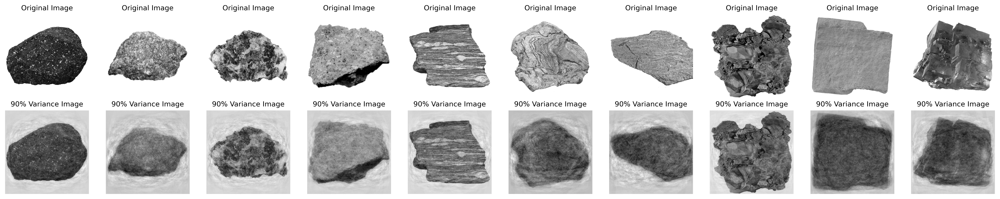

In [6]:
# From the 360 images, select one every 36 images, a total of 10 images
images = [cv2.imread(f, cv2.IMREAD_GRAYSCALE) for f in files]
indices = list(range(0, len(images), 36))[:10]

# Plot the original image and the reconstructed image (2 rows in total, 10 images per row)
fig, axes = plt.subplots(nrows=2, ncols=10, figsize=(20, 4), dpi=300)
for i, idx in enumerate(indices):

    original_img = X[idx].reshape(images[0].shape)
    reconstructed_img = X_reconstructed[idx].reshape(images[0].shape)
    
    # The top line draws the original image
    axes[0, i].imshow(original_img, cmap='gray')
    axes[0, i].set_title("Original Image", fontsize=10)
    axes[0, i].axis('off')
    
    # The bottom line draws the reconstruction graph
    axes[1, i].imshow(reconstructed_img, cmap='gray')
    axes[1, i].set_title("90% Variance Image", fontsize=10)
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

### 3. Each of the images belongs to one of three rock categories. The category is indicated by the first letter in the filename (I, M and S). We will now try to see if the visualization can help us identify different clusters.

A. Use PCA to reduce dimensionality to only 2 dimensions. How much of the variance is explained with the first two principal components? [2 points].

In [7]:
# Use PCA to reduce the dimension to 2 and calculate the proportion of variance explained
pca_2d = PCA(n_components=2)
pca_2d.fit(X)
explained_variance = np.sum(pca_2d.explained_variance_ratio_)
print("Amount of Variance preserved with these 2 components:", explained_variance)

Amount of Variance preserved with these 2 components: 0.3317705577328208


B. Plot a 2D scatter plot of the images spanned by the first two principal components. Each image will be represented with a dot. Make the color of the dot correspond to the image category (so you will have three different colors). Then add some rock images to the visualization to better understand what features in the images are accounting for the majority of variance in the data (your visualization should look similar to the one after line 71 in this file https://github.com/ageron/handson-ml3/blob/main/08_dimensionality_reduction.ipynbLinks to an external site. but with images of rocks instead of MNIST digits). Repeat the process and create the same type of plots for t-SNE, LLE and UMAP. [6 points]

In [8]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, LocallyLinearEmbedding
import umap

2025-04-18 16:30:05.441301: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-04-18 16:30:06.952785: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-04-18 16:30:07.215351: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745008207.661162 1497978 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745008207.797638 1497978 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1745008208.977925 1497978 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

In [9]:
labels = [os.path.basename(f)[0] for f in files]

# Define a color mapping dictionary: different categories use different colors
color_dict = {'I': 'red', 'M': 'green', 'S': 'blue'}
colors = [color_dict[label] for label in labels]

# Dimensionality reduction method

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)


# t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X)

# LLE
lle = LocallyLinearEmbedding(n_components=2, n_neighbors=30)  # n_neighbors可根据数据调节
X_lle = lle.fit_transform(X)

# UMAP
umap_reducer = umap.UMAP(n_components=2, random_state=42)
X_umap = umap_reducer.fit_transform(X)

In [10]:
# Display image in scatter plot

def scatter_plot_with_images(X_2d, images, labels, title, indices_to_annotate):
    """
    X_2d: 2D coordinates after dimensionality reduction, shape (n_samples, 2)
    images: original image list (2D grayscale images)
    labels: image category list
    title: image title
    indices_to_annotate: sample index list of images to be added to the scatter plot
    """
    plt.figure(figsize=(12, 10), dpi=300)
    ax = plt.gca()
    
    # Scatter plot
    scatter_colors = [color_dict[label] for label in labels]
    plt.scatter(X_2d[:, 0], X_2d[:, 1], c=scatter_colors, alpha=0.6, s=30, edgecolors='k')
    
    # Add images to some samples
    for i in indices_to_annotate:

        imagebox = OffsetImage(images[i], zoom=0.02, cmap='gray')
        ab = AnnotationBbox(imagebox, (X_2d[i, 0], X_2d[i, 1]), frameon=False)
        ax.add_artist(ab)
    plt.axis("off")
    plt.title(title)
    plt.grid(True)
    plt.show()

# Due to the large number of images, we only show 72 rock images.
indices_to_annotate = list(range(0, len(X), 5))

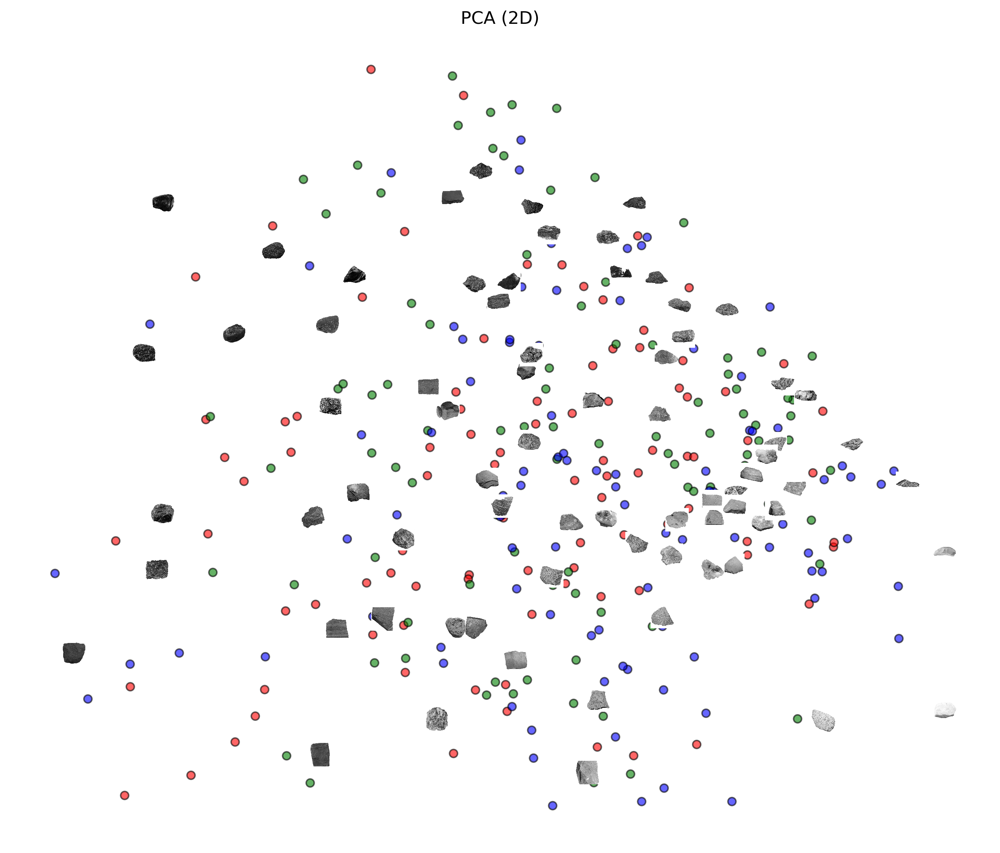

In [11]:
# PCA Visualization
scatter_plot_with_images(X_pca, images, labels, "PCA (2D)", indices_to_annotate)

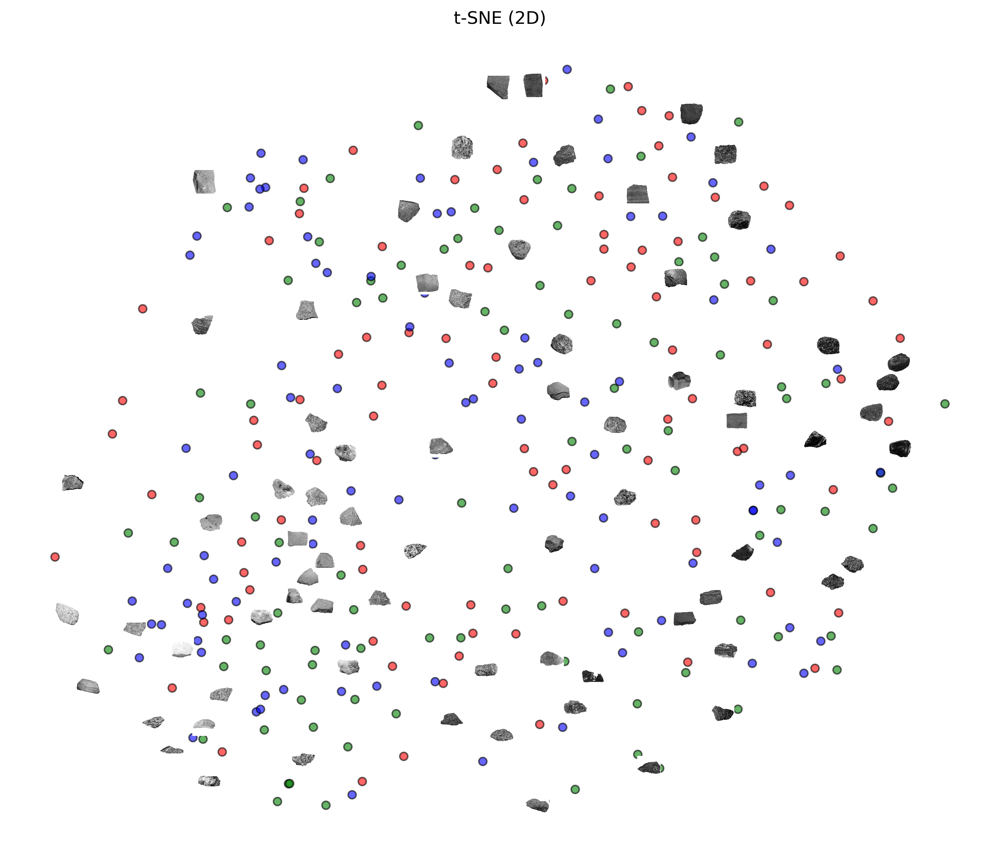

In [12]:
# t-SNE Visualization
scatter_plot_with_images(X_tsne, images, labels, "t-SNE (2D)", indices_to_annotate)

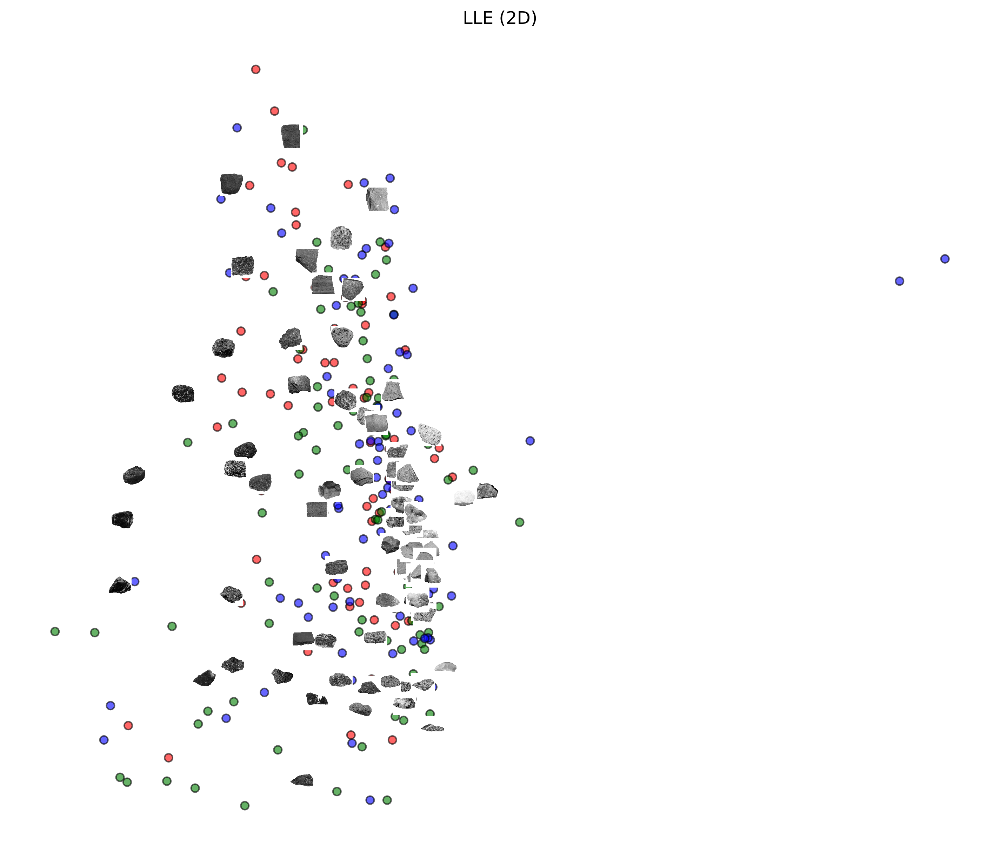

In [13]:
# LLE Visualization
scatter_plot_with_images(X_lle, images, labels, "LLE (2D)", indices_to_annotate)

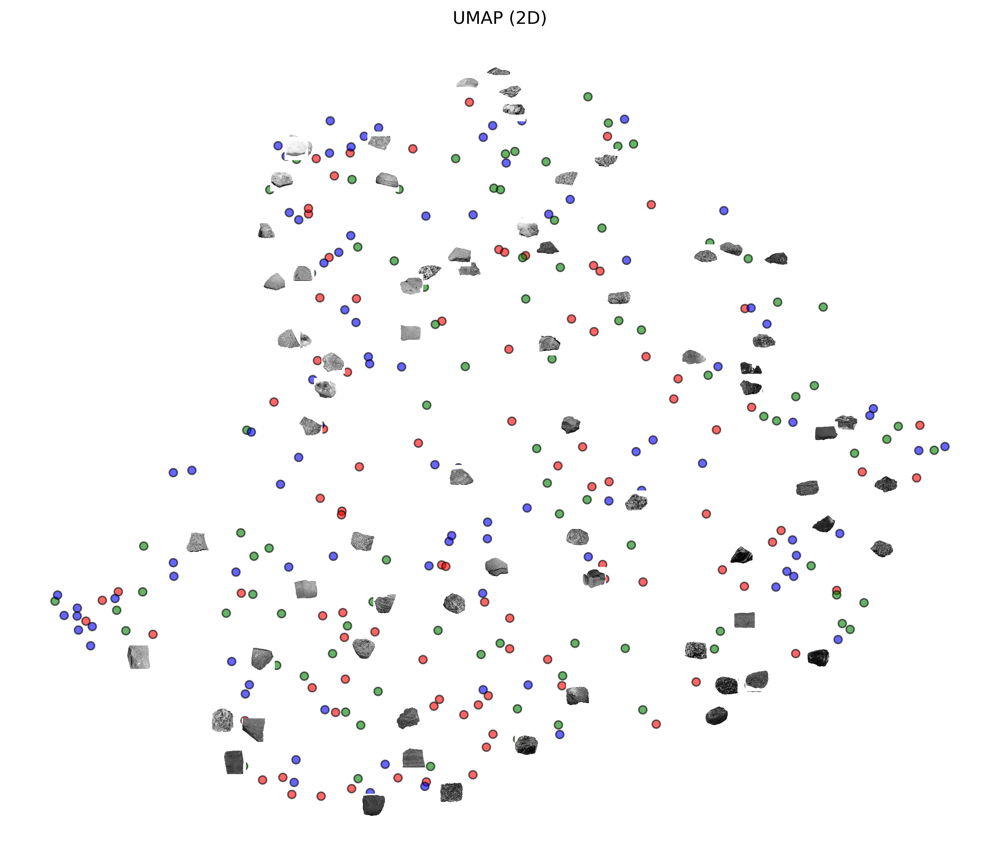

In [14]:
# UMAP Visualization
scatter_plot_with_images(X_umap, images, labels, "UMAP (2D)", indices_to_annotate)

C. Discuss your observations. [1 point]

- Rock image data may inherently have less distinct differences between classes compared to digits. Combined with factors like background and lighting variations, the resulting scatter plot after dimensionality reduction may appear less clustered.

- Different dimensionality reduction methods emphasize different aspects, and the resulting data structures can vary. It is necessary to further evaluate which method is best suited for the data by considering downstream tasks or domain knowledge.

- Adjusting preprocessing steps and dimensionality reduction parameters may help achieve a clearer separation of the classes.

### 4. Cluster the 360 images using K-Means.

A. You can reduce the dimensionality using PCA if you wish, but keep at least 95% of the variance. Determine the number of clusters using one of the techniques we discussed in class. [4 points]

In [15]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [16]:
# Reduce dimensionality using PCA to preserve 99% variance
pca = PCA(n_components=0.99)
X_reduced = pca.fit_transform(X)
print("Reduced data shape:", X_reduced.shape)
print("Number of principal components:", pca.n_components_)

# Determine the optimal number of clusters using silhouette score
silhouette_scores = []
K_range = range(2, 9)  # testing k from 2 to 9
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_reduced)
    score = silhouette_score(X_reduced, labels)
    silhouette_scores.append(score)

optimal_k = K_range[np.argmax(silhouette_scores)]
print("Optimal number of clusters according to silhouette score:", optimal_k)

# Cluster the data using K-Means with the chosen number of clusters
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42)
final_labels = kmeans_final.fit_predict(X_reduced)

Reduced data shape: (360, 317)
Number of principal components: 317
Optimal number of clusters according to silhouette score: 3


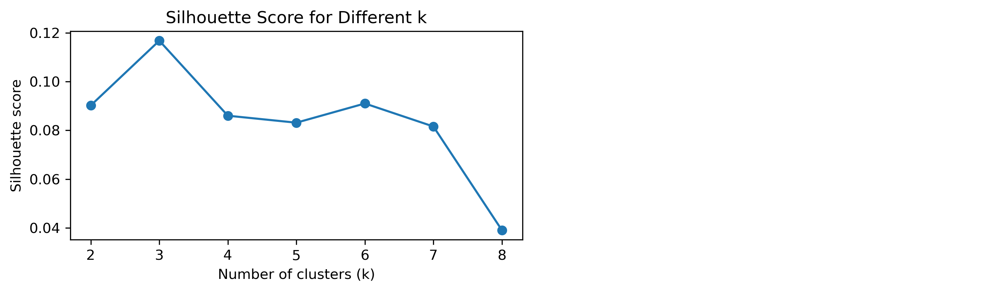

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3), dpi=300)

# Silhouette scores vs. number of clusters (k)
axes[0].plot(list(K_range), silhouette_scores, marker='o')
axes[0].set_xlabel("Number of clusters (k)")
axes[0].set_ylabel("Silhouette score")
axes[0].set_title("Silhouette Score for Different k")
axes[1].axis("off")
plt.tight_layout()
plt.show()

B. Set the number of clusters to 3, report clustering accuracy and show a confusion matrix. [4 points]

In [18]:
from sklearn.metrics import confusion_matrix, accuracy_score
from scipy.optimize import linear_sum_assignment

# Extract true labels from filenames
true_labels = [os.path.basename(f)[0] for f in files]
# Map letters to numbers 
label_map = {'I': 0, 'M': 1, 'S': 2}
y_true = np.array([label_map[label] for label in true_labels])

# Reduce dimensionality using PCA while preserving 99% of the variance.
pca = PCA(n_components=0.99)
X_reduced = pca.fit_transform(X)
print("Reduced data shape:", X_reduced.shape)
print("Number of principal components:", pca.n_components_)

# Set the number of clusters to 3.
kmeans = KMeans(n_clusters=3, random_state=42)
y_pred = kmeans.fit_predict(X_reduced)

Reduced data shape: (360, 317)
Number of principal components: 317


Raw clustering accuracy (before re-mapping): 0.4
Final clustering accuracy: 0.4
Confusion Matrix:
[[39 34 47]
 [31 43 46]
 [27 31 62]]


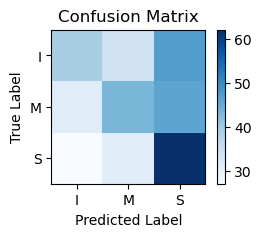

In [19]:
# Re-map Cluster Labels for Accuracy

def cluster_accuracy(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    
    row_ind, col_ind = linear_sum_assignment(-cm)
    accuracy = cm[row_ind, col_ind].sum() / np.sum(cm)
    return accuracy, cm, row_ind, col_ind

acc, cm, row_ind, col_ind = cluster_accuracy(y_true, y_pred)
print("Raw clustering accuracy (before re-mapping):", acc)

mapping = {pred_label: true_label for true_label, pred_label in zip(row_ind, col_ind)}
y_pred_mapped = np.array([mapping[label] for label in y_pred])

final_accuracy = accuracy_score(y_true, y_pred_mapped)
print("Final clustering accuracy:", final_accuracy)

final_cm = confusion_matrix(y_true, y_pred_mapped)
print("Confusion Matrix:")
print(final_cm)

# display the confusion matrix as a heatmap.
plt.figure(figsize=(3, 2))
plt.imshow(final_cm, interpolation="nearest", cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(len(label_map))
plt.xticks(tick_marks, list(label_map.keys()))
plt.yticks(tick_marks, list(label_map.keys()))
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

C. Visualize the figures from question 3B again, but this time, color the clusters based on your algorithm's output (it's enough to use only one method - either PCA, t-SNE, LLE or UMAP). [2 points]

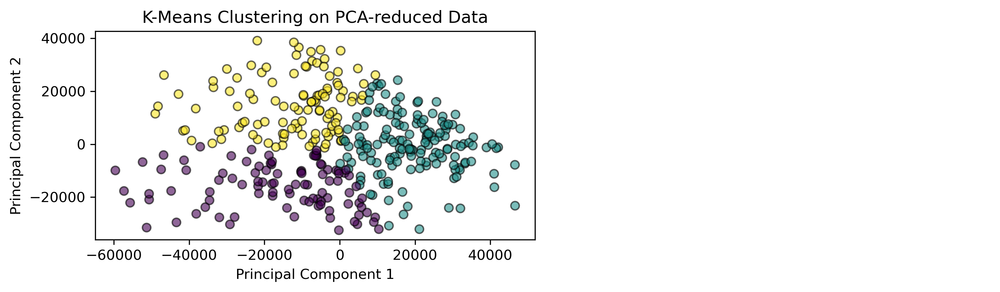

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3), dpi=300)

# Clustering result in the 2D PCA space (using the first two principal components)
scatter = axes[0].scatter(X_reduced[:, 0], X_reduced[:, 1], c=final_labels,
                           cmap='viridis', alpha=0.6, edgecolor='k')
axes[0].set_xlabel("Principal Component 1")
axes[0].set_ylabel("Principal Component 2")
axes[0].set_title("K-Means Clustering on PCA-reduced Data")

axes[1].axis("off")
plt.tight_layout()
plt.show()


### 5. Cluster the 360 images using EM.

A. You can again reduce the dimensionality using PCA if you wish, but keep at least 95% of the variance. Determine the number of clusters using one of the techniques we discussed in class. [4 points]

In [21]:
from sklearn.mixture import GaussianMixture

In [22]:
pca = PCA(n_components=0.99)  # Keep 99% of the variance
X_reduced = pca.fit_transform(X)
print("Reduced data shape:", X_reduced.shape)
print("Number of principal components:", pca.n_components_)

Reduced data shape: (360, 317)
Number of principal components: 317


In [23]:
#  Determine the Optimal Number of Clusters using BIC
bic_scores = []
K_range = range(2, 9)  # Test cluster numbers from 2 to 9
for k in K_range:
    gmm = GaussianMixture(n_components=k, random_state=42)
    gmm.fit(X_reduced)
    bic = gmm.bic(X_reduced)
    bic_scores.append(bic)
    print(f"k = {k}, BIC = {bic:.2f}")

k = 2, BIC = 2584298.23
k = 3, BIC = 884521.69
k = 4, BIC = 882632.63
k = 5, BIC = 1148051.70
k = 6, BIC = 1389859.15
k = 7, BIC = 1617294.93
k = 8, BIC = 1655911.26


Optimal number of clusters according to BIC: 4


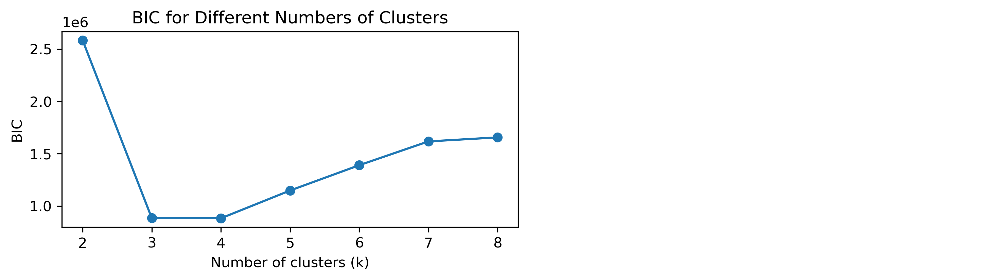

In [24]:
# Choose the number of clusters with the lowest BIC
optimal_k = K_range[np.argmin(bic_scores)]
print("Optimal number of clusters according to BIC:", optimal_k)

fig, axes = plt.subplots(1, 2, figsize=(10, 3), dpi=300)

# BIC vs. number of clusters (k)
axes[0].plot(list(K_range), bic_scores, marker='o')
axes[0].set_xlabel("Number of clusters (k)")
axes[0].set_ylabel("BIC")
axes[0].set_title("BIC for Different Numbers of Clusters")
axes[1].axis("off")
plt.tight_layout()
plt.show()

In [25]:
gmm_final = GaussianMixture(n_components=optimal_k, random_state=42)
y_pred = gmm_final.fit_predict(X_reduced)


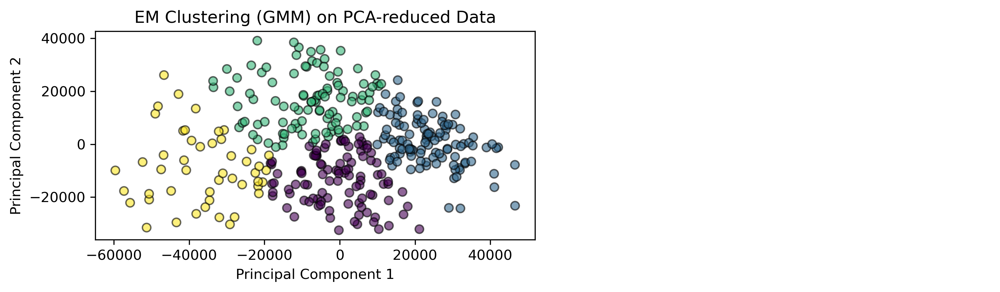

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3), dpi=300)

# Clustering result in the 2D PCA space (using the first two principal components)
scatter = axes[0].scatter(X_reduced[:, 0], X_reduced[:, 1], c=y_pred,
                           cmap='viridis', alpha=0.6, edgecolor='k')
axes[0].set_xlabel("Principal Component 1")
axes[0].set_ylabel("Principal Component 2")
axes[0].set_title("EM Clustering (GMM) on PCA-reduced Data")

axes[1].axis("off")
plt.tight_layout()
plt.show()

B. Set the number of clusters to 3, report clustering accuracy and show a confusion matrix. [4 points]

In [27]:
true_labels = [os.path.basename(f)[0] for f in files]

# Map category letters to numbers, e.g., 'I' -> 0, 'M' -> 1, 'S' -> 2
label_map = {'I': 0, 'M': 1, 'S': 2}
y_true = np.array([label_map[label] for label in true_labels])

In [28]:
pca = PCA(n_components=0.99)
X_reduced = pca.fit_transform(X)
# Cluster the Data using EM with 3 clusters
gmm = GaussianMixture(n_components=3, random_state=42)
y_pred = gmm.fit_predict(X_reduced)

def cluster_accuracy(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    row_ind, col_ind = linear_sum_assignment(-cm)  # maximize the assignment (minimize negative)
    accuracy = cm[row_ind, col_ind].sum() / np.sum(cm)
    return accuracy, cm, row_ind, col_ind

acc, cm, row_ind, col_ind = cluster_accuracy(y_true, y_pred)
print("Raw clustering accuracy (before mapping):", acc)

# Create a mapping 
mapping = {pred: true for true, pred in zip(row_ind, col_ind)}
y_pred_mapped = np.array([mapping[label] for label in y_pred])

final_accuracy = accuracy_score(y_true, y_pred_mapped)
print("Final clustering accuracy:", final_accuracy)

Raw clustering accuracy (before mapping): 0.4
Final clustering accuracy: 0.4


Confusion Matrix:
[[39 34 47]
 [31 43 46]
 [27 31 62]]


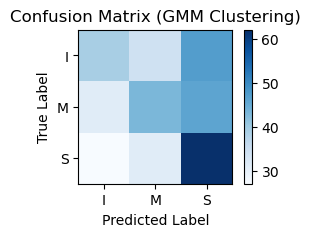

In [29]:
# Display the Confusion Matrix
final_cm = confusion_matrix(y_true, y_pred_mapped)
print("Confusion Matrix:")
print(final_cm)

plt.figure(figsize=(3, 2))
plt.imshow(final_cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix (GMM Clustering)")
plt.colorbar()
ticks = np.arange(len(label_map))
plt.xticks(ticks, list(label_map.keys()))
plt.yticks(ticks, list(label_map.keys()))
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

C. Visualize the figures from question 3B again (it's enough to use only one method - either PCA, t-SNE, LLE or UMAP), but this time, color the clusters based on your algorithm's output. [2 points]

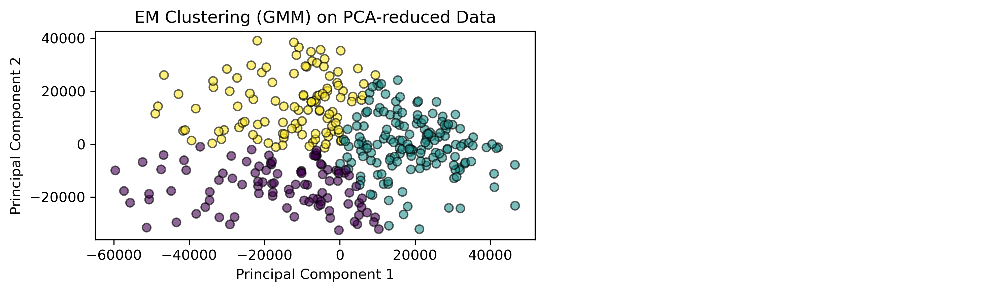

In [30]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3), dpi=300)

# Clustering result in the 2D PCA space (using the first two principal components)
scatter = axes[0].scatter(X_reduced[:, 0], X_reduced[:, 1], c=final_labels,
                           cmap='viridis', alpha=0.6, edgecolor='k')
axes[0].set_xlabel("Principal Component 1")
axes[0].set_ylabel("Principal Component 2")
axes[0].set_title("EM Clustering (GMM) on PCA-reduced Data")

axes[1].axis("off")
plt.tight_layout()
plt.show()

D. Use the model to generate 20 new rocks (using the sample() method), and visualize them in the original image space (since you used PCA, you will need to use its inverse_transform() method).  [4 points]

Shape of generated data: (20, 640000)


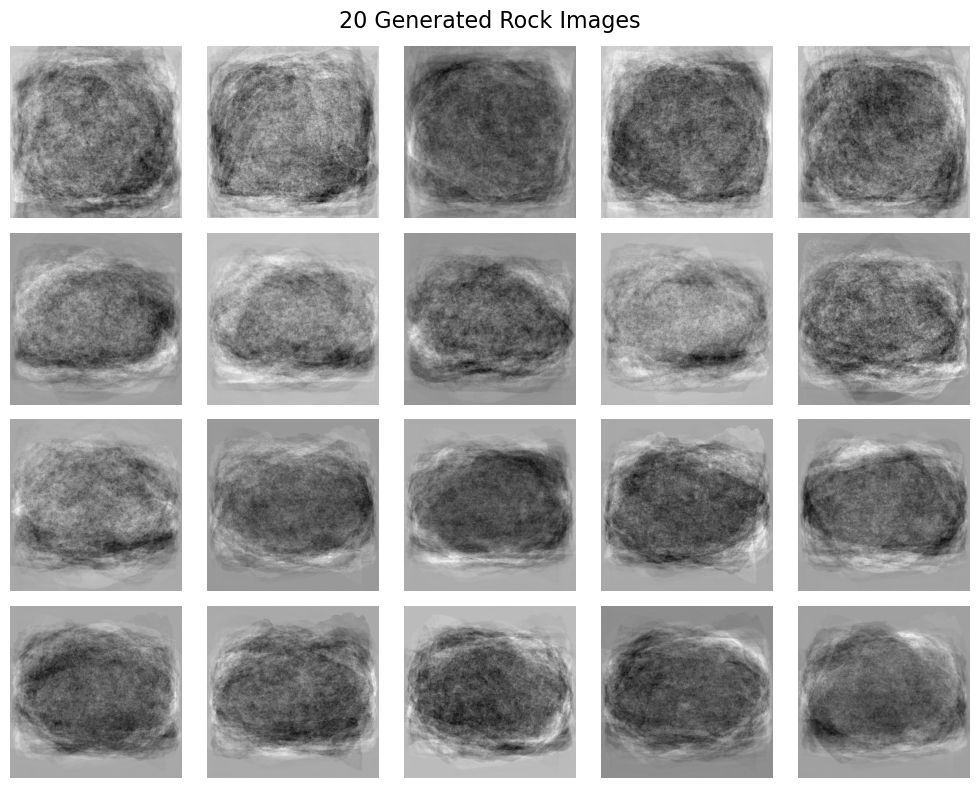

In [31]:
# Generate 20 New Samples
X_new_reduced, _ = gmm.sample(20)

# Transform these new samples from the PCA space back to the original feature space.
X_new = pca.inverse_transform(X_new_reduced)
print("Shape of generated data:", X_new.shape)  

# Reshape the Generated Samples to Images

new_images = [sample.reshape(800, 800) for sample in X_new]

# Visualize the 20 Generated Rock Images
fig, axes = plt.subplots(4, 5, figsize=(10, 8))  
axes = axes.flatten()
for i, ax in enumerate(axes):
    ax.imshow(new_images[i], cmap='gray')
    ax.axis('off')
plt.suptitle("20 Generated Rock Images", fontsize=16)
plt.tight_layout()
plt.show()

### 6. Build a feedforward neural network (using dense and/or CNN layers) with a few hidden layers (we suggest using Keras (within Tensorflow) or Pytorch). Train the network to classify 360 rock images using rock name as the label - the category is indicated by the first letter in the filename (I, M and S). Use images from '120 Rocks' folder as your validation data. Choose the number of neurons you find appropriate and efficient (so you have enough time to run it). The hidden layers should have ReLU activation function. Train the network for multiple epochs until it converges (if the process is too slow, tweak the learning rate and consider simplifying your network). We will not deduct points based on the simplicity of your network, but we expect you to have performance that is above chance performance that could be obtained with an untrained network - in other words, we expect to see train and validation loss decrease and accuracy increase throughout the training. We recommend using Colab (the free version should be totally fine), but make sure to run it with a GPU to speed up the training - to add a GPU on Colab go to Edit->Notebook settings). 

A. Report the training time (use code to do this). [1 point]

In [32]:
import os, glob, time, random
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, regularizers, callbacks

tf.keras.utils.set_random_seed(0)    
AUTOTUNE  = tf.data.AUTOTUNE
IMG_SIZE  = (128, 128)
BATCH_SZ  = 32
NUM_CLASS = 3
CKPT_DIR  = "ckpt"                    

train_files = sorted(glob.glob("/N/project/Zli_lab/gongg/AML/360 Rocks/*.jpg"))
val_files   = sorted(glob.glob("/N/project/Zli_lab/gongg/AML/120 Rocks/*.jpg"))


keys = tf.constant(['I', 'M', 'S']); vals = tf.constant([0, 1, 2])
label_table = tf.lookup.StaticHashTable(
    tf.lookup.KeyValueTensorInitializer(keys, vals), -1)

augment = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.10),
], name="augment")

def _preprocess(path):
    fname = tf.strings.split(path, os.sep)[-1]
    label = label_table.lookup(tf.strings.substr(fname, 0, 1))
    img   = tf.io.read_file(path)
    img   = tf.image.decode_jpeg(img, channels=3)
    img   = tf.image.resize(img, IMG_SIZE)
    img   = tf.cast(img, tf.float32) / 255.0
    return img, label

def make_ds(files, training=True):
    ds = tf.data.Dataset.from_tensor_slices(files).map(
        _preprocess, num_parallel_calls=AUTOTUNE)
    if training:
        ds = ds.shuffle(1000, seed=0)
    return ds.batch(BATCH_SZ).prefetch(AUTOTUNE)

train_ds = make_ds(train_files, training=True)
val_ds   = make_ds(val_files,   training=False)

# ================================================================
reg = regularizers.l2(1e-4)

def build_model(training=True):
    inputs = keras.Input(shape=(*IMG_SIZE, 3))
    x = augment(inputs) if training else inputs
    x = layers.Conv2D(32, 3, activation='relu', kernel_regularizer=reg, name="conv2d")(x)
    x = layers.MaxPool2D()(x)
    x = layers.Conv2D(64, 3, activation='relu', kernel_regularizer=reg, name="conv2d_1")(x)
    x = layers.MaxPool2D()(x)
    x = layers.Conv2D(96, 3, activation='relu', kernel_regularizer=reg, name="conv2d_2")(x)
    x = layers.Flatten()(x)
    x = layers.Dense(64, activation='relu', kernel_regularizer=reg, name="dense")(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(NUM_CLASS, activation='softmax')(x)
    return keras.Model(inputs, outputs, name="rock_cnn")

2025-04-18 16:34:26.746766: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [34]:
os.makedirs(CKPT_DIR, exist_ok=True)

model = build_model(training=True)
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

cbs = [
    callbacks.ModelCheckpoint(
        filepath=os.path.join(CKPT_DIR, "epoch_{epoch:02d}.weights.h5"),
        save_freq='epoch', save_weights_only=True),
    callbacks.EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True),
    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)
]

EPOCHS = 60
t0 = time.time()
history = model.fit(train_ds,
                    validation_data=val_ds,
                    epochs=EPOCHS,
                    callbacks=cbs)
print(f"\nElapsed training time: {time.time()-t0:.1f}s")
model.save_weights(os.path.join(CKPT_DIR, "best_final.weights.h5"))

Model: "rock_cnn"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ augment (Sequential)            │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 96)     │        55,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 75264)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │     4,816,960 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,891,939 (18.66 MB)

 Trainable params: 4,891,939 (18.66 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - accuracy: 0.3877 - loss: 1.7515 - val_accuracy: 0.3333 - val_loss: 1.1338 - learning_rate: 0.0010
Epoch 2/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - accuracy: 0.3517 - loss: 1.1285 - val_accuracy: 0.3250 - val_loss: 1.1203 - learning_rate: 0.0010
Epoch 3/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 190ms/step - accuracy: 0.3025 - loss: 1.1201 - val_accuracy: 0.3417 - val_loss: 1.1186 - learning_rate: 0.0010
Epoch 4/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 200ms/step - accuracy: 0.3024 - loss: 1.1234 - val_accuracy: 0.3333 - val_loss: 1.1183 - learning_rate: 0.0010
Epoch 5/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 185ms/step - accuracy: 0.3404 - loss: 1.1188 - val_accuracy: 0.3833 - val_loss: 1.1145 - learning_rate: 0.0010
Epoch 6/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 188ms/step - accuracy: 0.2795 - loss: 1.1180 - val_accuracy: 0.3250 - val_loss: 1.1069 - learning_rate: 0.0010
Epoch 7/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 200ms/step - accuracy: 0.3293 - loss: 1.1148 - 

B. Plot training and validation loss and accuracy as a function of training epochs. [2 points]

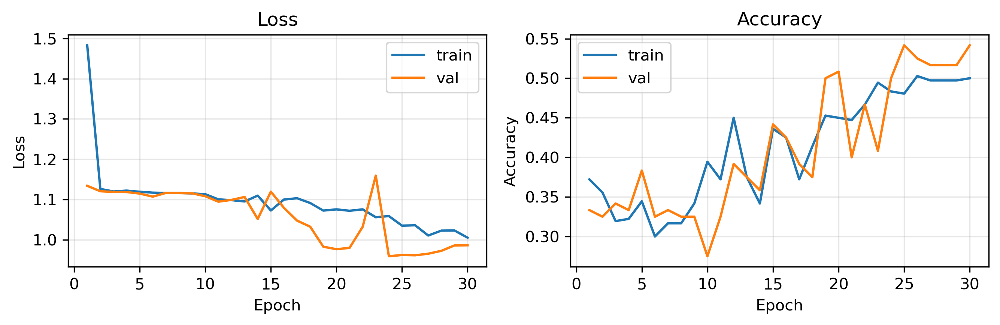

In [35]:
def plot_history(hist):

    epochs = range(1, len(hist.history["loss"]) + 1)

    fig, ax = plt.subplots(1, 2, figsize=(9, 3), dpi=300)

    # Loss
    ax[0].plot(epochs, hist.history["loss"],     label="train")
    ax[0].plot(epochs, hist.history["val_loss"], label="val")
    ax[0].set_xlabel("Epoch"); ax[0].set_ylabel("Loss"); ax[0].set_title("Loss")
    ax[0].grid(alpha=.3); ax[0].legend()

    # Accuracy
    ax[1].plot(epochs, hist.history["accuracy"],     label="train")
    ax[1].plot(epochs, hist.history["val_accuracy"], label="val")
    ax[1].set_xlabel("Epoch"); ax[1].set_ylabel("Accuracy"); ax[1].set_title("Accuracy")
    ax[1].grid(alpha=.3); ax[1].legend()

    plt.tight_layout()
    plt.show()

plot_history(history)


C. How many parameters does the network have? How many of those parameters are bias parameters? [1 point]

In [36]:
total_params = model.count_params()
bias_params  = sum(
    tf.keras.backend.count_params(w)
    for w in model.trainable_weights
    if "bias" in w.name
)

print(f"Total parameters : {total_params:,}")
print(f"Bias  parameters : {bias_params:,}")
print(f"Kernel/other     : {total_params - bias_params:,}")


Total parameters : 4,891,939
Bias  parameters : 259
Kernel/other     : 4,891,680


D. Repeat part 5 (except 5D) on activity from neurons in your first layer (closest to the input), some layer around the middle of the network, and the layer just before the output layer. Note that in this case, the input to EM is the neural activity, not the image itself. Thus, the dimensionality of the input is determined by how many neurons you have in that particular layer. Do this process around the middle of the training [3 points] and after you complete the training. [3 points] Discuss the changes you observe in clustering across the network and throughout the training. [1 point]

In [37]:
from sklearn.decomposition import PCA
from sklearn.mixture      import GaussianMixture as GMM
from sklearn.metrics      import confusion_matrix, accuracy_score
from scipy.optimize       import linear_sum_assignment

def get_activations(dataset, mdl, layer_name):
    extractor = keras.Model(mdl.input, mdl.get_layer(layer_name).output)
    X, y = [], []
    for batch_x, batch_y in dataset:
        act = extractor(batch_x, training=False)
        X.append(tf.reshape(act, [act.shape[0], -1]).numpy())
        y.append(batch_y.numpy())
    return np.concatenate(X), np.concatenate(y)

def em_cluster(X, y, use_pca=True, pca_var=0.95):
    if use_pca:
        X = PCA(n_components=pca_var, svd_solver="full", whiten=True,
                random_state=0).fit_transform(X)
    gmm = GMM(n_components=NUM_CLASS, covariance_type="full", random_state=0)
    y_pred = gmm.fit_predict(X)

    cm = confusion_matrix(y, y_pred)
    ri, ci = linear_sum_assignment(-cm)       
    mapping = {c: r for r, c in zip(ri, ci)}
    y_aligned = np.vectorize(mapping.get)(y_pred)

    acc = accuracy_score(y, y_aligned)
    cm  = confusion_matrix(y, y_aligned)
    return acc, cm

def run_clustering(weights_path, tag):
    print(f"\n==========  Clustering ({tag})  ==========")
    mdl = build_model(training=False)
    mdl.build((None, *IMG_SIZE, 3))            # build
    mdl.load_weights(weights_path)

    for lname in ["conv2d", "conv2d_1", "dense"]:
        X, y = get_activations(train_ds, mdl, lname)
        acc, cm = em_cluster(X, y)
        print(f"Layer {lname:>8s} | acc = {acc:.3f}")
        print(cm, "\n")

# Select midway & final weights and run
ckpts = sorted(glob.glob(os.path.join(CKPT_DIR, "epoch_*.weights.h5")))
mid_ckpt   = ckpts[len(ckpts)//2]        # Middle
final_ckpt = ckpts[-1]                   # Final
best_ckpt  = os.path.join(CKPT_DIR, "best_final.weights.h5")

run_clustering(mid_ckpt,   "mid‑training")
run_clustering(final_ckpt, "last epoch")
run_clustering(best_ckpt,  "early‑stopped best")


==========  Clustering (mid‑training)  ==========


2025-04-18 16:40:08.312246: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Layer   conv2d | acc = 0.339
[[  1 119   0]
 [  0 120   0]
 [  0 119   1]] 



2025-04-18 16:40:24.091145: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Layer conv2d_1 | acc = 0.342
[[112   4   4]
 [107   8   5]
 [111   6   3]] 

Layer    dense | acc = 0.481
[[15 75 30]
 [10 77 33]
 [ 7 32 81]] 


==========  Clustering (last epoch)  ==========


2025-04-18 16:40:32.013725: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Layer   conv2d | acc = 0.367
[[114   0   6]
 [105   2  13]
 [103   1  16]] 

Layer conv2d_1 | acc = 0.339
[[120   0   0]
 [119   1   0]
 [119   0   1]] 

Layer    dense | acc = 0.442
[[ 29  89   2]
 [  9 101  10]
 [ 44  47  29]] 


==========  Clustering (early‑stopped best)  ==========
Layer   conv2d | acc = 0.339
[[  1   0 119]
 [  0   1 119]
 [  0   0 120]] 



2025-04-18 16:41:11.558150: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Layer conv2d_1 | acc = 0.339
[[120   0   0]
 [117   2   1]
 [119   1   0]] 

Layer    dense | acc = 0.472
[[31 83  6]
 [ 9 98 13]
 [36 43 41]] 



**Discussion**

1. **Overall separability is weak**  
   - The first two conv layers reach only ~0.34 accuracy, and the dense layer tops out at ~0.44, so the learned features still can’t clearly separate the three rock classes.

2. **Further training brings little clustering gain**  
   - Accuracy changes by less than ±0.02 between mid‑training, last epoch, and the early‑stopped best model, suggesting the network hits a ceiling early on.

3. **GMM often collapses to a single cluster**  
   - Confusion matrices show an entire column/row with 120 samples, meaning GMM assigns almost everything to one cluster. Deeper models, better dimensionality reduction, or more GMM initializations may help.